In [1]:
import numpy as np
import matplotlib.pyplot as plt
from medpy import io
from radiomics import featureextractor, imageoperations
import six
import os
import pandas as pd
import SimpleITK as sitk
import seaborn as sns
from sklearn.metrics import roc_auc_score
import math

/u/home/seel/.conda/envs/conda-adlm/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [6]:
data_path = "/data1/practical-sose23/morphometric/data/"
seg_guer_path = "/data1/practical-sose23/morphometric/picai_labels/anatomical_delineations/whole_gland/AI/Guerbet23/"
seg_bosma_path = "/data1/practical-sose23/morphometric/picai_labels/anatomical_delineations/whole_gland/AI/Bosma22b/"

def get_image_and_segmentaion(patient_id, study_id):
    if not isinstance(patient_id, str):
        patient_id = str(patient_id)

    if not isinstance(study_id, str):
        study_id = str(study_id)
    
    image = None
    segmentation = None
    for file in os.listdir(data_path + patient_id + "/"):
        modality = "t2w"
        string = "{0}_{1}_{2}.mha".format(patient_id,study_id,modality)
        if string == file:
            if study_id in file:
                image = sitk.ReadImage(data_path + patient_id + "/" +  file, sitk.sitkFloat32)
                path_image = data_path + patient_id + "/" +  file

    for file in os.listdir(seg_guer_path):
        if patient_id+"_"+study_id + ".nii.gz" == file:
            
            segmentation = sitk.ReadImage(seg_guer_path + file, sitk.sitkUInt8)
            path_mask = seg_guer_path + file

    return (image, segmentation)

def plot_sitk(sitk_obj):

    pixel_array = sitk.GetArrayFromImage(sitk_obj)
    
    columns = 5
    rows = math.ceil(pixel_array.shape[0] / columns)

    fig = plt.figure(figsize=(20,rows*4))

    for i in range(pixel_array.shape[0]):
        #im = data[:,:,i]
        #mask = 
        fig.add_subplot(rows, columns, i+1)
        plt.imshow(pixel_array[i], cmap="gray", interpolation="none")

In [78]:
gt = pd.read_csv("/data1/practical-sose23/morphometric/picai_labels/clinical_information/marksheet.csv")
gt

,patient_id,study_id,mri_date,patient_age,psa,psad,prostate_volume,histopath_type,lesion_GS,lesion_ISUP,case_ISUP,case_csPCa
0,10000,1000000,2019-07-02,73,7.70,NaN,55.0,MRBx,0+0,0,0,NO
1,10001,1000001,2016-05-27,64,8.70,0.09,102.0,NaN,NaN,NaN,0,NO
2,10002,1000002,2021-04-18,58,4.20,0.06,74.0,NaN,NaN,NaN,0,NO
3,10003,1000003,2019-04-05,72,13.00,NaN,71.5,SysBx,0+0,0,0,NO
4,10004,1000004,2020-10-21,67,8.00,0.10,78.0,SysBx+MRBx,"0+0,0+0","0,0",0,NO
...,...,...,...,...,...,...,...,...,...,...,...,...
1495,11471,1001495,2012-08-25,71,12.50,0.21,62.0,MRBx,"3+4,N/A,3+3","2,1",2,YES
1496,11472,1001496,2019-06-28,81,5.28,0.12,44.0,SysBx+MRBx,3+4,2,2,YES
1497,11473,1001497,2017-09-24,56,29.60,0.34,87.0,MRBx,0+0,0,0,NO
1498,11474,1001498,2016-05-03,71,12.00,NaN,83.0,MRBx,3+3,1,1,NO


# Collect header information for each scan

In [79]:
image, mask = get_image_and_segmentaion(10000, 1000000)
image.GetWidth()

640

In [80]:
df = pd.DataFrame([])

for index, row in gt.iterrows():
    if isinstance(row['prostate_volume'], float):
        print(str(index), end= "\r")

        image, mask = get_image_and_segmentaion(row["patient_id"], row["study_id"])

        new_row = {"study_id": row["study_id"], 
                   "patient_id": row["patient_id"],
                   "spacing_0" : image.GetSpacing()[0],
                   "spacing_1" : image.GetSpacing()[1],
                    "spacing_2" : image.GetSpacing()[2],
                    "size_0" :  image.GetSize()[0],
                    "size_1" :  image.GetSize()[1],
                    "size_2" :  image.GetSize()[2],
                    "origin" : image.GetOrigin(),
                    "real_dimension_0" : image.GetSpacing()[0] * image.GetSize()[0],
                    "real_dimension_1": image.GetSpacing()[1] * image.GetSize()[1],
                    "real_dimension_2": image.GetSpacing()[2] * image.GetSize()[2],
        }
        df = df.append(new_row, ignore_index=True)

df

,study_id,patient_id,spacing_0,spacing_1,spacing_2,size_0,size_1,size_2,origin,real_dimension_0,real_dimension_1,real_dimension_2
0,1000000.0,10000.0,0.28125,0.28125,3.3,640.0,640.0,31.0,"(-109.22891616821, -76.614260508237, -84.29311...",180.000000,180.000000,102.299999
1,1000001.0,10001.0,0.30000,0.30000,3.6,640.0,640.0,21.0,"(-119.80861242576, -65.872387498812, -38.77975...",192.000008,192.000008,75.600002
2,1000002.0,10002.0,0.50000,0.50000,3.0,384.0,384.0,22.0,"(-75.958717345721, -101.90842263373, 12.320441...",192.000000,192.000000,66.000002
3,1000003.0,10003.0,0.50000,0.50000,3.0,384.0,384.0,23.0,"(-75.050601958758, -69.85840339031, -25.163462...",192.000000,192.000000,69.000002
4,1000004.0,10004.0,0.30000,0.30000,3.6,640.0,640.0,21.0,"(-81.364946364887, -95.368903586534, -26.19577...",192.000008,192.000008,75.599999
...,...,...,...,...,...,...,...,...,...,...,...,...
1495,1001495.0,11471.0,0.50000,0.50000,3.5,384.0,384.0,19.0,"(-97.750484605452, -77.4502615813, 22.10853373...",192.000000,192.000000,66.500000
1496,1001496.0,11472.0,0.30000,0.30000,3.6,640.0,640.0,19.0,"(-97.75048839999, -69.636696595946, -10.762666...",192.000008,192.000008,68.400000
1497,1001497.0,11473.0,0.30000,0.30000,3.6,640.0,640.0,21.0,"(-134.6929564654, -68.377214345749, 10.8437984...",192.000008,192.000008,75.600000
1498,1001498.0,11474.0,0.62500,0.62500,3.6,320.0,320.0,23.0,"(-82.320760657283, -92.827634358737, -44.54878...",200.000000,200.000000,82.799997


# Analyze the results

In [61]:
#df = pd.read_pickle("../radiomics/meta-information-all-t2w-scans.pkl")
#df

In [81]:
df["real_dimension_0"].loc[df["real_dimension_0"]<100]

15      76.666668
22      76.666668
65      76.666668
103     76.666668
105     76.666668
          ...    
1466    76.666668
1474    76.666668
1484    76.666668
1485    76.666668
1489    76.666668
Name: real_dimension_0, Length: 95, dtype: float64

In [82]:
problem = df.loc[df["real_dimension_0"]<100]
problem

,study_id,patient_id,spacing_0,spacing_1,spacing_2,size_0,size_1,size_2,origin,real_dimension_0,real_dimension_1,real_dimension_2
15,1000015.0,10015.0,0.342262,0.342262,3.0,224.0,224.0,27.0,"(-48.83695136826844, -20.685437057508224, -31....",76.666668,76.666668,80.999998
22,1000022.0,10022.0,0.342262,0.342262,3.0,224.0,224.0,27.0,"(-60.303809060782456, -20.639826254346417, -94...",76.666668,76.666668,80.999998
65,1000065.0,10065.0,0.342262,0.342262,3.0,224.0,224.0,27.0,"(-33.65318125466999, -38.89347652695565, -34.5...",76.666668,76.666668,80.999999
103,1000103.0,10103.0,0.342262,0.342262,3.0,224.0,224.0,27.0,"(-39.064015328878014, -27.005580258517796, -15...",76.666668,76.666668,80.999999
105,1000105.0,10105.0,0.342262,0.342262,3.0,224.0,224.0,27.0,"(-40.59280272293436, -21.297397507988855, -214...",76.666668,76.666668,80.999998
...,...,...,...,...,...,...,...,...,...,...,...,...
1466,1001466.0,11442.0,0.342262,0.342262,3.0,224.0,224.0,27.0,"(-33.1969274195689, -17.02052632208455, -110.9...",76.666668,76.666668,80.999996
1474,1001474.0,11450.0,0.342262,0.342262,3.0,224.0,224.0,27.0,"(-39.26515209130153, -30.776723423875694, -63....",76.666668,76.666668,80.999998
1484,1001484.0,11460.0,0.342262,0.342262,3.0,224.0,224.0,27.0,"(-49.885655581760005, 2.12664603396712, -133.5...",76.666668,76.666668,80.999998
1485,1001485.0,11461.0,0.342262,0.342262,3.0,224.0,224.0,31.0,"(-66.07657448228305, -43.69748681894268, -18.4...",76.666668,76.666668,92.999999


In [83]:
row = problem.iloc[0]
image, mask = get_image_and_segmentaion(int(row["patient_id"]), int(row["study_id"]))

In [95]:
patient_id = "10065"
study_id = "1000065"
modality = "t2w"
file = "{0}_{1}_{2}.mha".format(patient_id,study_id,modality)
print(data_path + patient_id + "/" +  file)
regular = sitk.ReadImage(data_path + patient_id + "/" +  file, sitk.sitkFloat32)
print(data_path + patient_id + "/" +  "orig_" +file)
orig = sitk.ReadImage(data_path + patient_id + "/" +  "orig_" +file, sitk.sitkFloat32)
print(data_path + patient_id + "/" +  "orig_orig_" +file)
orig_orig = sitk.ReadImage(data_path + patient_id + "/" +  "orig_orig_" +file, sitk.sitkFloat32)

/data1/practical-sose23/morphometric/data/10065/10065_1000065_t2w.mha
/data1/practical-sose23/morphometric/data/10065/orig_10065_1000065_t2w.mha
/data1/practical-sose23/morphometric/data/10065/orig_orig_10065_1000065_t2w.mha


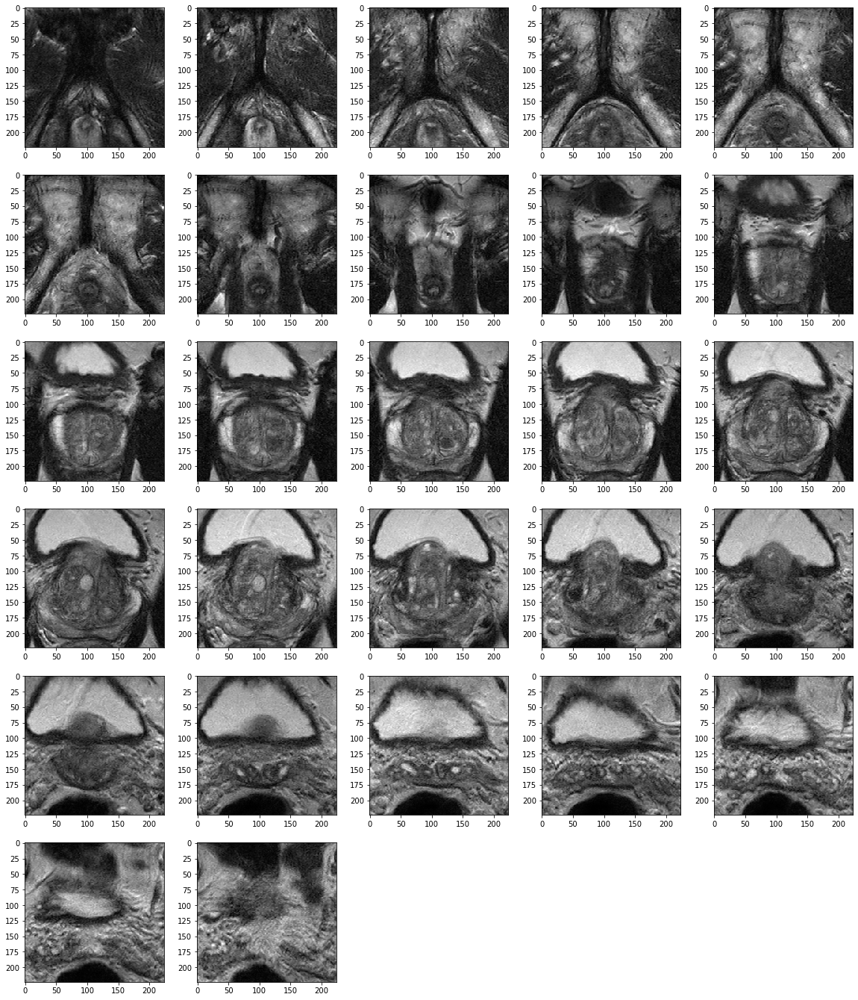

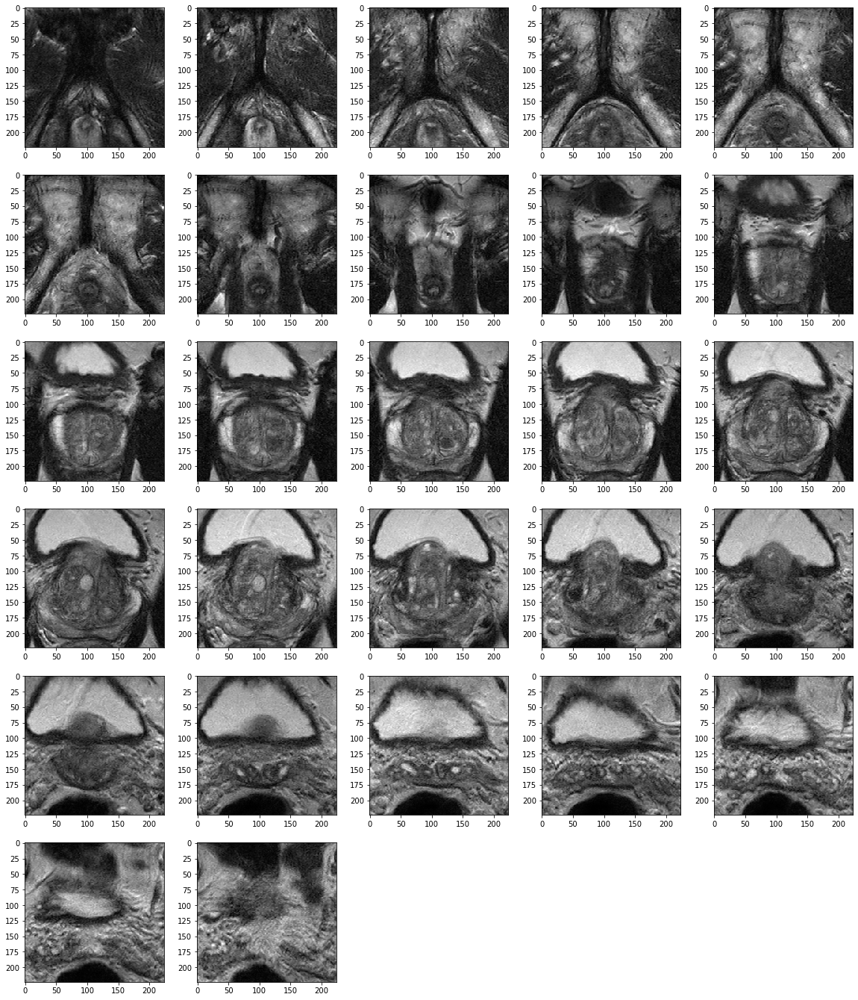

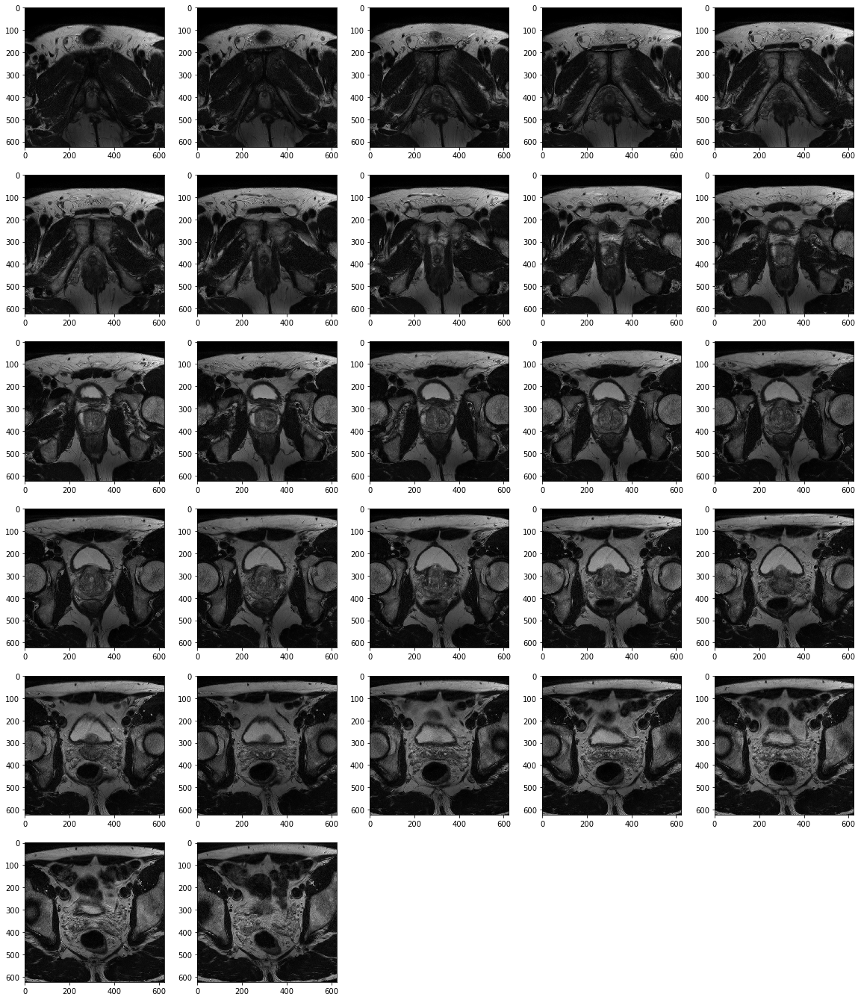

In [96]:
plot_sitk(regular)
plot_sitk(orig)
plot_sitk(orig_orig)

In [98]:
patient_id = "10065"
study_id = "1000065"
modality = "t2w"
file = "{0}_{1}.nii.gz".format(patient_id,study_id)

print( seg_guer_path +   file)
regular = sitk.ReadImage(seg_guer_path +  file, sitk.sitkFloat32)
print(seg_guer_path +  "orig_" +file)
orig = sitk.ReadImage(seg_guer_path +  "orig_" +file, sitk.sitkFloat32)
print(seg_guer_path +  "orig_orig_" +file)
orig_orig = sitk.ReadImage(seg_guer_path +  "orig_orig_" +file, sitk.sitkFloat32)

/data1/practical-sose23/morphometric/picai_labels/anatomical_delineations/whole_gland/AI/Guerbet23/10065_1000065.nii.gz
/data1/practical-sose23/morphometric/picai_labels/anatomical_delineations/whole_gland/AI/Guerbet23/orig_10065_1000065.nii.gz
/data1/practical-sose23/morphometric/picai_labels/anatomical_delineations/whole_gland/AI/Guerbet23/orig_orig_10065_1000065.nii.gz


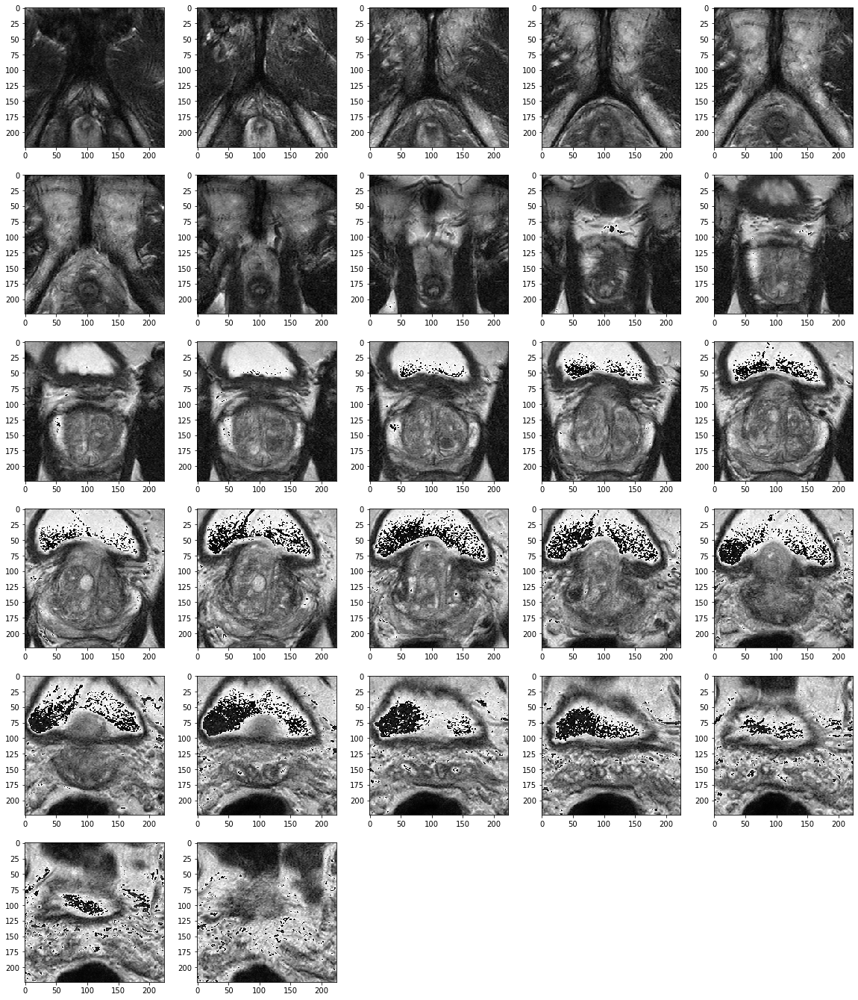

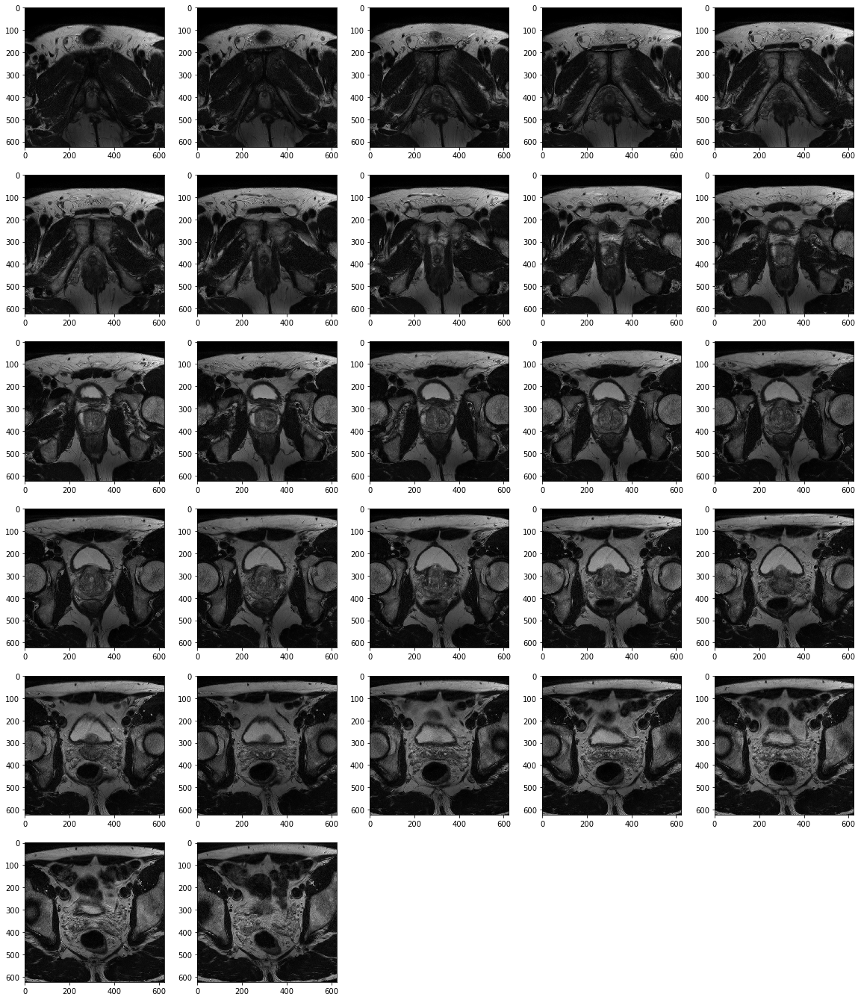

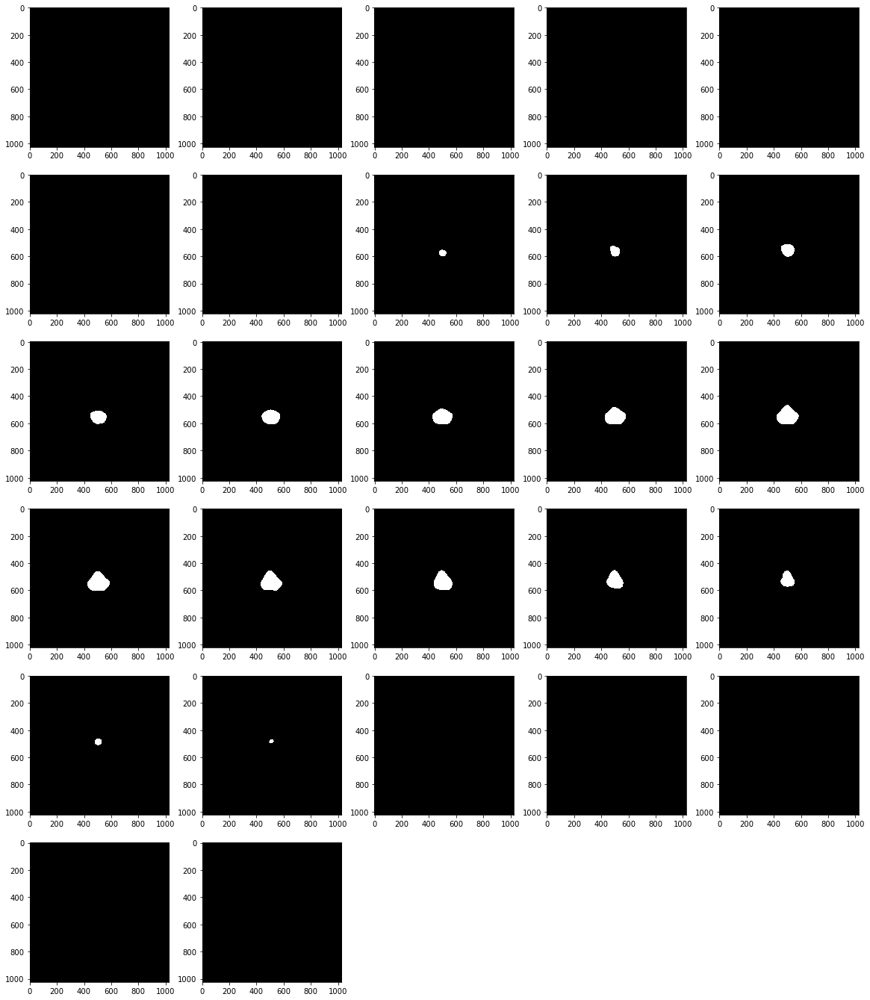

In [99]:
plot_sitk(regular)
plot_sitk(orig)
plot_sitk(orig_orig)

(624, 624, 27)


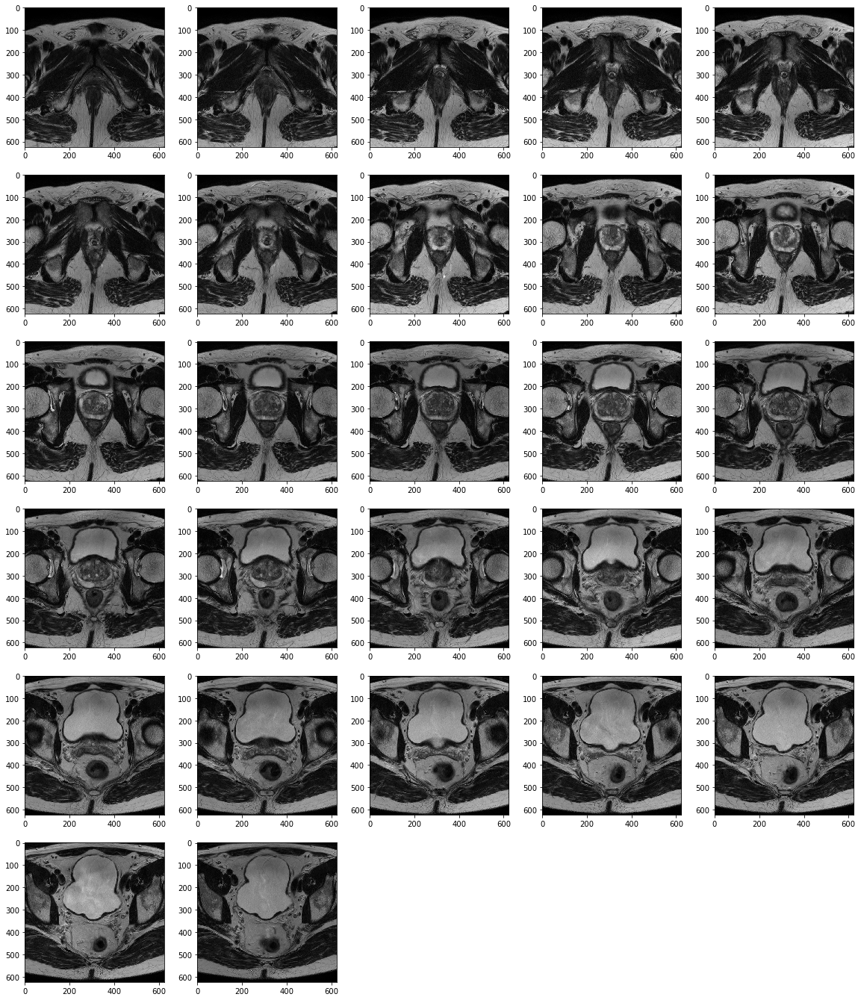

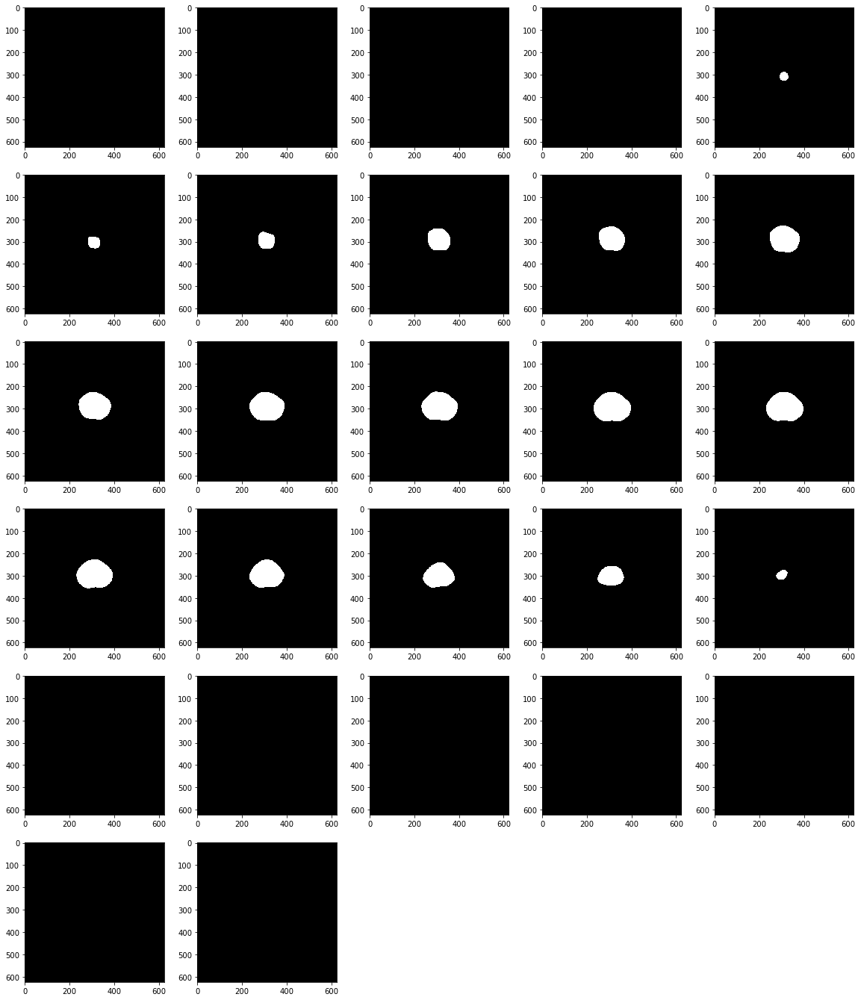

In [67]:
crop = sitk.CropImageFilter()
crop.SetLowerBoundaryCropSize([200, 200, 0])
crop.SetUpperBoundaryCropSize([200,200,0])
cropped_image = crop.Execute(image)
cropped_mask = crop.Execute(mask)
print(cropped_image.GetSize())
plot_sitk(cropped_image)
plot_sitk(cropped_mask)

# Fix Problem globally

In [68]:
for index, row in problem.iterrows():
    
    print(str(index))#, end= "\r")

    crop = sitk.CropImageFilter()
    crop.SetLowerBoundaryCropSize([200, 200, 0])
    crop.SetUpperBoundaryCropSize([200,200,0])

    patient_id = str(int(row["patient_id"]))
    study_id = str(int(row["study_id"]))

    for file in os.listdir(data_path + patient_id + "/"):
        if "t2w" in file:
            if study_id in file:
                image = sitk.ReadImage(data_path + patient_id + "/" +  file, sitk.sitkFloat32)
                cropped_image = crop.Execute(image)

                os.rename(data_path + patient_id + "/" +  file, data_path + patient_id + "/" + "orig_" +file)
                #print(data_path + patient_id + "/" +  file, data_path + patient_id + "/" + "orig_" +file)

                writer = sitk.ImageFileWriter()
                writer.SetFileName(data_path + patient_id + "/" +  file)
                writer.Execute(cropped_image)

    for file in os.listdir(seg_guer_path):
        if patient_id+"_"+study_id in file:
            
            mask = sitk.ReadImage(seg_guer_path + file, sitk.sitkUInt8)
            cropped_mask = crop.Execute(mask)

            os.rename(seg_guer_path + file, seg_guer_path + "orig_" + file)
            #print(seg_guer_path + file, seg_guer_path + "orig_" + file)
            writer = sitk.ImageFileWriter()
            writer.SetFileName(seg_guer_path + file)
            writer.Execute(cropped_mask)
            
    
    

15
22
65
103
105
135
136
141
144
177
198
219
222
227
261
267
302
321
337
369
378
445
461
490
514
522
536
538
552
553
560
561
571
584
585
592
633
641
655
656
663
682
684
686
687
690
703
728
744
751
778
814
825
828
835
883
894
914
921
922
930
948
952
953
954
955
957
985
989
1023
1024
1026
1028
1037
1045
1066
1124
1189
1197
1199
1211
1250
1259
1283
1305
1377
1403
1428
1430
1440
1466
1474
1484
1485
1489


# Double check the result
Lets hope it all worked again

In [69]:
df = pd.DataFrame([])

for index, row in gt.iterrows():
    if isinstance(row['prostate_volume'], float):
        print(str(index), end= "\r")

        image, mask = get_image_and_segmentaion(row["patient_id"], row["study_id"])

        new_row = {"study_id": row["study_id"], 
                   "patient_id": row["patient_id"],
                   "spacing_0" : image.GetSpacing()[0],
                   "spacing_1" : image.GetSpacing()[1],
                    "spacing_2" : image.GetSpacing()[2],
                    "size_0" :  image.GetSize()[0],
                    "size_1" :  image.GetSize()[1],
                    "size_2" :  image.GetSize()[2],
                    "origin" : image.GetOrigin(),
                    "real_dimension_0" : image.GetSpacing()[0] * image.GetSize()[0],
                    "real_dimension_1": image.GetSpacing()[1] * image.GetSize()[1],
                    "real_dimension_2": image.GetSpacing()[2] * image.GetSize()[2],
        }
        df = df.append(new_row, ignore_index=True)

df

,study_id,patient_id,spacing_0,spacing_1,spacing_2,size_0,size_1,size_2,origin,real_dimension_0,real_dimension_1,real_dimension_2
0,1000000.0,10000.0,0.28125,0.28125,3.3,640.0,640.0,31.0,"(-109.22891616821, -76.614260508237, -84.29311...",180.000000,180.000000,102.299999
1,1000001.0,10001.0,0.30000,0.30000,3.6,640.0,640.0,21.0,"(-119.80861242576, -65.872387498812, -38.77975...",192.000008,192.000008,75.600002
2,1000002.0,10002.0,0.50000,0.50000,3.0,384.0,384.0,22.0,"(-75.958717345721, -101.90842263373, 12.320441...",192.000000,192.000000,66.000002
3,1000003.0,10003.0,0.50000,0.50000,3.0,384.0,384.0,23.0,"(-75.050601958758, -69.85840339031, -25.163462...",192.000000,192.000000,69.000002
4,1000004.0,10004.0,0.30000,0.30000,3.6,640.0,640.0,21.0,"(-81.364946364887, -95.368903586534, -26.19577...",192.000008,192.000008,75.599999
...,...,...,...,...,...,...,...,...,...,...,...,...
1495,1001495.0,11471.0,0.50000,0.50000,3.5,384.0,384.0,19.0,"(-97.750484605452, -77.4502615813, 22.10853373...",192.000000,192.000000,66.500000
1496,1001496.0,11472.0,0.30000,0.30000,3.6,640.0,640.0,19.0,"(-97.75048839999, -69.636696595946, -10.762666...",192.000008,192.000008,68.400000
1497,1001497.0,11473.0,0.30000,0.30000,3.6,640.0,640.0,21.0,"(-134.6929564654, -68.377214345749, 10.8437984...",192.000008,192.000008,75.600000
1498,1001498.0,11474.0,0.62500,0.62500,3.6,320.0,320.0,23.0,"(-82.320760657283, -92.827634358737, -44.54878...",200.000000,200.000000,82.799997


In [70]:
problem = df.loc[df["real_dimension_0"]>250]
problem

,study_id,patient_id,spacing_0,spacing_1,spacing_2,size_0,size_1,size_2,origin,real_dimension_0,real_dimension_1,real_dimension_2


so far so good

In [71]:
df.loc[df["real_dimension_0"].idxmin()]

study_id                                                    1000103.0
patient_id                                                    10103.0
spacing_0                                                    0.342262
spacing_1                                                    0.342262
spacing_2                                                         3.0
size_0                                                          224.0
size_1                                                          224.0
size_2                                                           27.0
origin              (-39.064015328878014, -27.005580258517796, -15...
real_dimension_0                                            76.666668
real_dimension_1                                            76.666668
real_dimension_2                                            80.999999
Name: 103, dtype: object

thats a tad strange

In [72]:
image, mask = get_image_and_segmentaion(10103, 1000103)

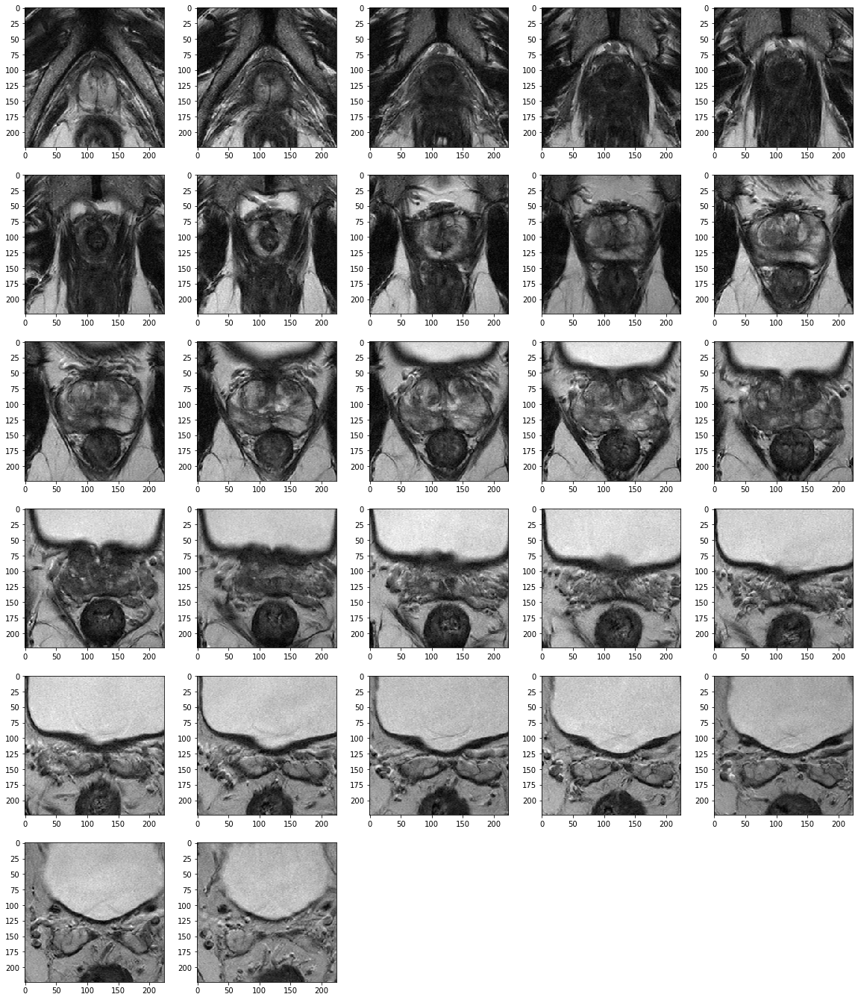

In [73]:
plot_sitk(image)

# quick check that it all worked out

In [24]:
import imageio

In [4]:
df = pd.read_pickle("../radiomics/meta-information-all-t2w-scans.pkl")
problem = df.loc[df["real_dimension_0"]>300]

In [28]:
for i,row in problem.iterrows():
    patient_id = int(row["patient_id"])
    study_id = int(row["study_id"])
    im, seg = get_image_and_segmentaion(patient_id, study_id)
    im_size = im.GetSize()
    seg_size = seg.GetSize()
    
    
    image = sitk.GetArrayFromImage(im)
    segmentation = sitk.GetArrayFromImage(seg)

    im_slice = image[len(image)//2]
    seg_slice = segmentation[len(segmentation)//2]

    imageio.imwrite("../images/cropped_scans/{0}_{1}.png".format(patient_id, study_id), im_slice)
    #imageio.imwrite("../images/cropped_masks/{0}_{1}.png".format(patient_id, study_id), seg_slice)



Lossy conversion from float32 to uint8. Range [0.0, 1192.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0.0, 177.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0.0, 526.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0.0, 666.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0.0, 614.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0.0, 494.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0.0, 435.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0.0, 477.0]. Convert image to uint8 prior to saving to suppress this warning.